In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import glob
import re
import matplotlib.pyplot as plt
import sys
import seaborn as sns

In [2]:
#sys.path.insert(1, '/secure/projects/tacco/')
#import tacco as tc

In [3]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/')

In [4]:
from init_phase2 import * 

running without plotnine


In [5]:
res_dir=baseDir+"/analysis/02_combined/"
os.makedirs(res_dir,exist_ok=True)

In [6]:
adata_all=sc.read_h5ad(out_dir+"/fresh_frozen_combined.h5ad")

In [7]:
def process(adata,resolution=0.4):    
    #sc.pp.highly_variable_genes(adata,flavor='seurat_v3',n_top_genes=5000)
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

    adata.raw = adata

    adata = adata[:, adata.var['highly_variable']]
    sc.pp.regress_out(adata, ['n_counts', 'pct_counts_mt'])

    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack',random_state=42)
    sc.pp.neighbors(adata,random_state=42)
    sc.tl.leiden(adata,resolution=resolution,random_state=42)
    sc.tl.umap(adata,random_state=42)
    return(adata)

In [8]:
def do_bbknn(adata,resolution=0.4):
    #store old umap to prevent it from being overwritten
    adata.uns['orig_umap']=adata.uns['umap']
    adata.obsm['orig_X_umap']=adata.obsm['X_umap']
    adata.uns['orig_neighbors']=adata.uns['neighbors']
    
    sc.external.pp.bbknn(adata,batch_key="batch")
    
    sc.tl.leiden(adata,random_state=42,resolution=resolution,neighbors_key='neighbors',key_added='bbknn_leiden')
    sc.tl.leiden(adata,random_state=42,resolution=resolution,neighbors_key='orig_neighbors',key_added='leiden')
    sc.tl.umap(adata,random_state=42,neighbors_key='neighbors')
    #move old umap back
    adata.uns['bbknn_umap']=adata.uns['umap']
    adata.uns['umap']=adata.uns['orig_umap']
    adata.uns['bbknn_neighbors']=adata.uns['neighbors']
    adata.uns['neighbors']=adata.uns['orig_neighbors']
    adata.obsm['bbknn_X_umap']=adata.obsm['X_umap']
    adata.obsm['X_umap']=adata.obsm['orig_X_umap']
    del(adata.uns['orig_umap'])
    del(adata.uns['orig_neighbors'])
    del(adata.obsm['orig_X_umap'])
    return adata

In [9]:
pd.DataFrame(adata_all.obs.loc[:,['batch','name']].value_counts()).reset_index()['batch'].value_counts()

sn    37
sc    30
Name: batch, dtype: int64

In [10]:
sel_obs=['batch', 'cell_id', 'name', 'condition', 'replicate', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito','pct_counts_mt','cell_type']

In [18]:
#only Macrophages
adata_sel=anndata.AnnData(X=adata_all[adata_all.obs.cell_type=="Macrophage"].obsm['counts'],obs=adata_all[adata_all.obs.cell_type=="Macrophage"].obs[sel_obs],var=pd.DataFrame(index=adata_all[adata_all.obs.cell_type=="Macrophage"].raw.var))

In [21]:
adata_sel=process(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [27]:
adata_sel=do_bbknn(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


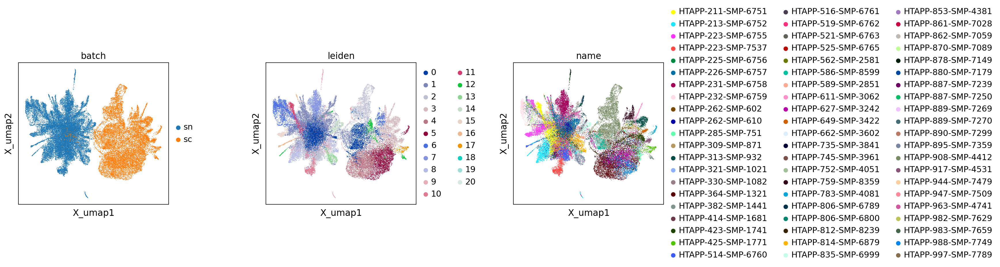

In [36]:
fig=sc.pl.embedding(adata_sel,basis='X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_pre_bbknn_MP.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


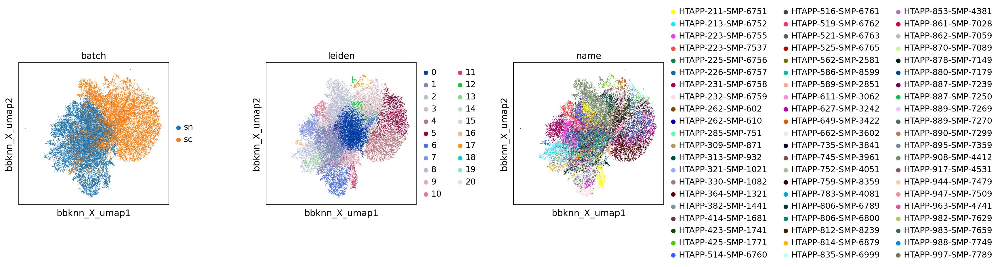

In [37]:
fig=sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_post_bbknn_MP.pdf',bbox_inches='tight')

In [38]:
#only T
adata_sel=anndata.AnnData(X=adata_all[adata_all.obs.cell_type=="T"].obsm['counts'],obs=adata_all[adata_all.obs.cell_type=="T"].obs[sel_obs],var=pd.DataFrame(index=adata_all[adata_all.obs.cell_type=="T"].raw.var.index))

In [39]:
adata_sel=process(adata_sel)

In [40]:
adata_sel=do_bbknn(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


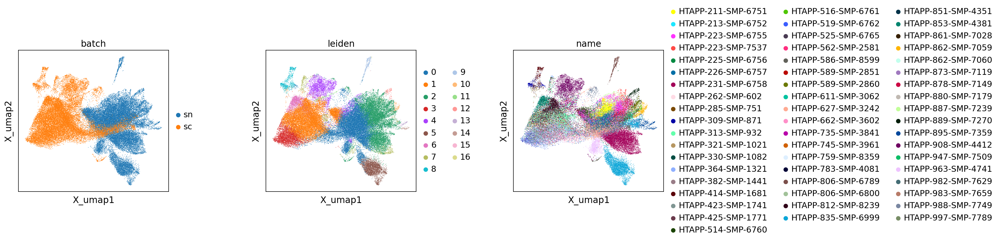

In [41]:
fig=sc.pl.embedding(adata_sel,basis='X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_pre_bbknn_T.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


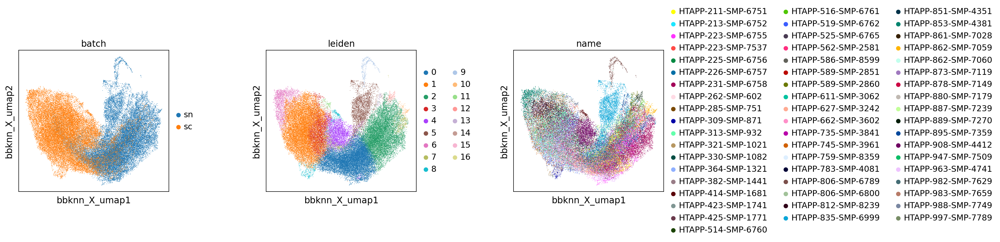

In [42]:
fig=sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_post_bbknn_T.pdf',bbox_inches='tight')

In [43]:
#only Fibroblast
adata_sel=anndata.AnnData(X=adata_all[adata_all.obs.cell_type=="Fibroblast"].obsm['counts'],obs=adata_all[adata_all.obs.cell_type=="Fibroblast"].obs[sel_obs],var=pd.DataFrame(index=adata_all[adata_all.obs.cell_type=="Fibroblast"].raw.var.index))

In [44]:
adata_sel=process(adata_sel)

In [45]:
adata_sel=do_bbknn(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


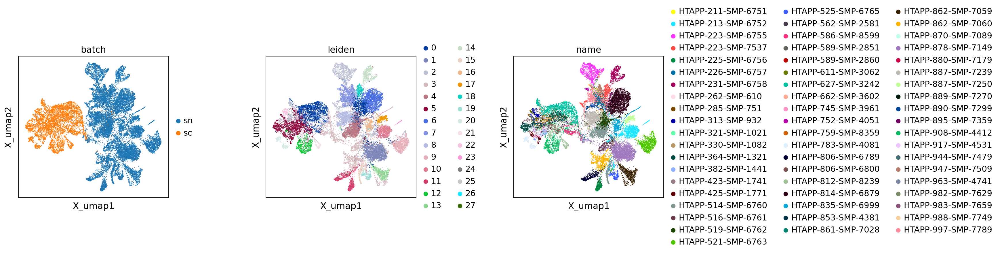

In [46]:
fig=sc.pl.embedding(adata_sel,basis='X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_pre_bbknn_Fib.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


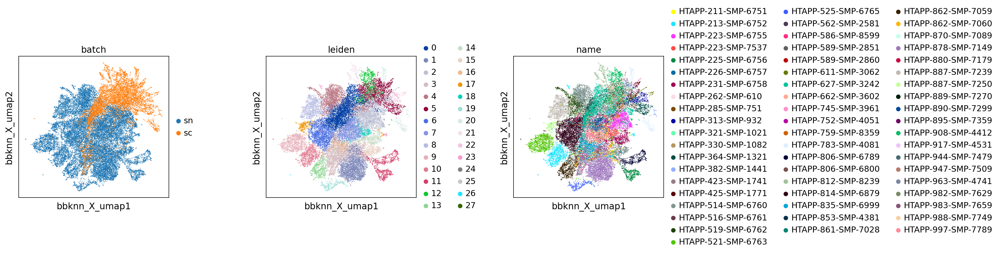

In [47]:
fig=sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.5)
fig.savefig(res_dir+'/UMAP_post_bbknn_Fib.pdf',bbox_inches='tight')

In [48]:
#only Malignant
adata_sel=anndata.AnnData(X=adata_all[adata_all.obs.cell_type.isin(['MBC','MBC_neuronal','MBC_stem-like'])].obsm['counts'],obs=adata_all[adata_all.obs.cell_type.isin(['MBC','MBC_neuronal','MBC_stem-like'])].obs[sel_obs],var=pd.DataFrame(index=adata_all[adata_all.obs.cell_type.isin(['MBC','MBC_neuronal','MBC_stem-like'])].raw.var.index))

In [49]:
adata_sel=process(adata_sel)

In [50]:
adata_sel=do_bbknn(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


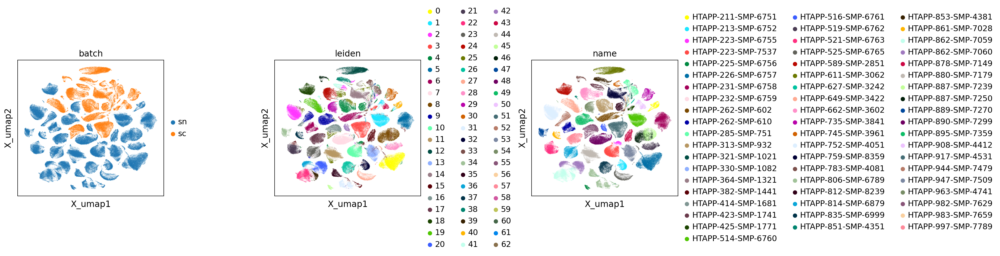

In [54]:
fig=sc.pl.embedding(adata_sel,basis='X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.6)
fig.savefig(res_dir+'/UMAP_pre_bbknn_Mal.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


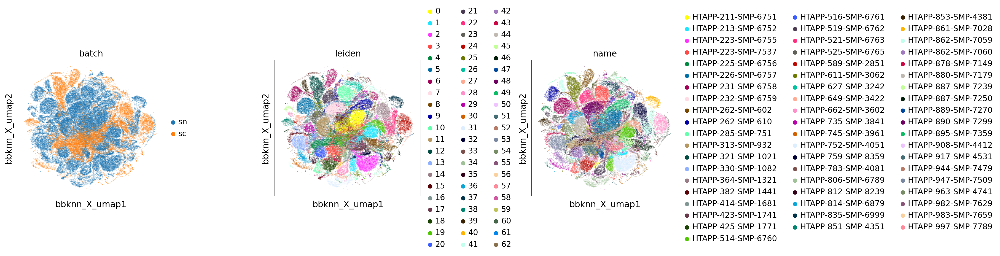

In [55]:
fig=sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.6)
fig.savefig(res_dir+'/UMAP_post_bbknn_Mal.pdf',bbox_inches='tight')

In [11]:
#All cells
adata_sel=anndata.AnnData(X=adata_all.obsm['counts'],obs=adata_all.obs[sel_obs],var=pd.DataFrame(index=adata_all.raw.var.index))

In [12]:
adata_sel=process(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
adata_sel=do_bbknn(adata_sel)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


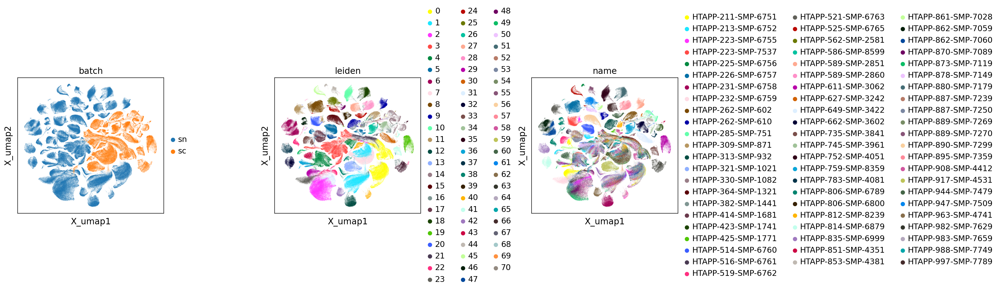

In [18]:
fig=sc.pl.embedding(adata_sel,basis='X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.6)
fig.savefig(res_dir+'/UMAP_pre_bbknn_all.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


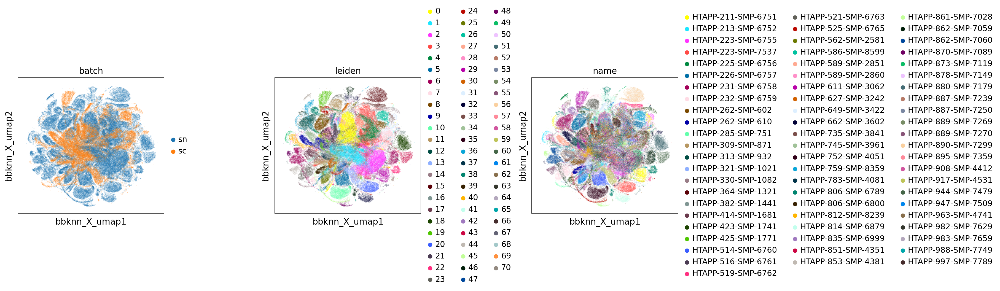

In [19]:
fig=sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['batch','leiden','name'],return_fig=True,wspace=0.6)
fig.savefig(res_dir+'/UMAP_post_bbknn_all.pdf',bbox_inches='tight')

In [21]:
adata_sel.obs['cell_type']=pd.Categorical(adata_sel.obs['cell_type'], categories=colors.index)

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


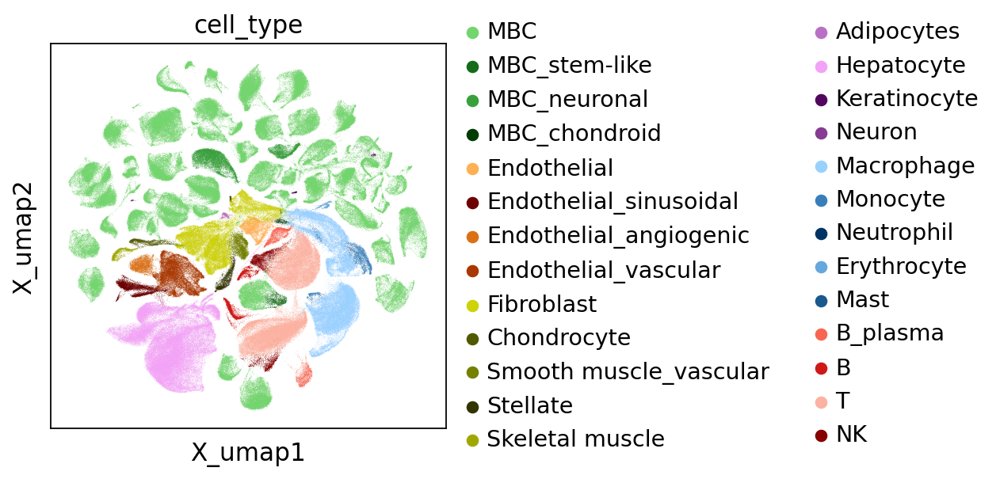

In [22]:
fig = sc.pl.embedding(adata_sel,basis='X_umap', color=['cell_type'],palette=colors.values.tolist(),return_fig=True);
fig.savefig(res_dir+'/UMAP_pre_bbknn_all_ct.pdf',bbox_inches='tight')

/secure/src/anaconda3/envs/BBKNN/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


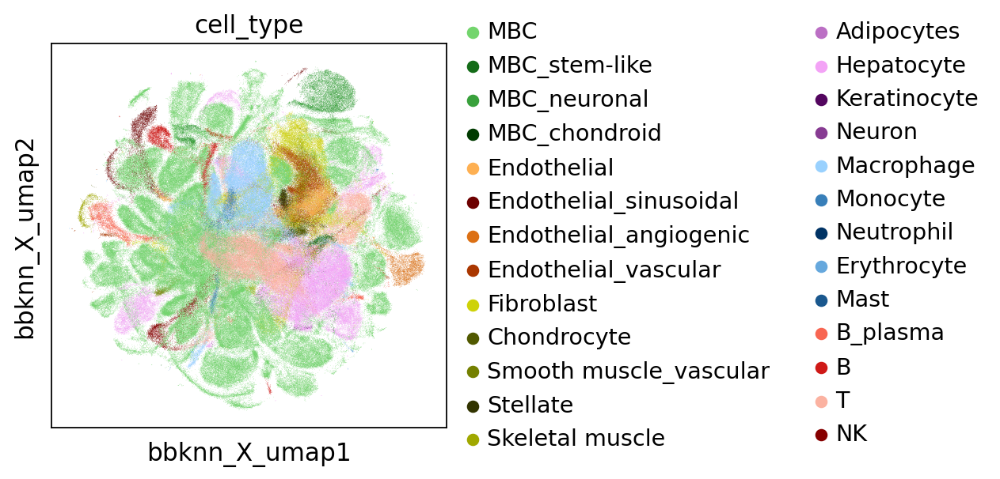

In [23]:
fig = sc.pl.embedding(adata_sel,basis='bbknn_X_umap', color=['cell_type'],palette=colors.values.tolist(),return_fig=True);
fig.savefig(res_dir+'/UMAP_post_bbknn_all_ct.pdf',bbox_inches='tight')